# Dataset Analysis and Visualisation

This notebook will be used to analyse the distribution across all labelling categories, and for the visualisation of the dataset, its statistics, and some of the annotated images.

## Import Dependencies

In [1]:
import os
import json
from pathlib import Path
import zipfile
import io
from collections import Counter, defaultdict
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

In [2]:
%matplotlib inline

## Basic Dataset Info

In [3]:
# paths
DATASET_ROOT = os.path.join('Dataset')
DATASET_SPLIT = os.path.join(DATASET_ROOT, 'Train-Test-Val Split')
COCO_DATA = os.path.join(DATASET_SPLIT, 'COCO-based')

In [4]:
# total images in dataset

zip_path = os.path.join(DATASET_ROOT, 'merged_images.zip')    # path to zipfile that contains all images

with zipfile.ZipFile(zip_path, 'r') as z:
    total_files = len(z.namelist())

print(f'Dataset contains {total_files} images in total.')

Dataset contains 715 images in total.


After all annotations were complete, and every member's individual images/annotations were merged into the final complete dataset, the dataset was split into Train/Validation/Test subsets using the provided LS2COCO.ipynb with a 70%/15%/15% split.

In [5]:
# total images in each train/val/test subset

zip_path = os.path.join(DATASET_SPLIT, 'images.zip')   # path to zip file containing dataset images

folder_counts = Counter()   # count files per sub folder

with zipfile.ZipFile(zip_path, "r") as z:
    for info in z.infolist():
        if info.is_dir():
            continue  # skip directories

        folder = os.path.dirname(info.filename)
        folder_counts[folder] += 1

for folder, count in folder_counts.items():
    print(f"{folder}: {count} images.")

images/test: 119 images.
images/train: 485 images.
images/val: 111 images.


## Dataset Class Distribution

This section will visualise the class distribution of the dataset for all 5 labelling categories (sign type, viewing angle, mounting type, sign condition, sign shape type) by computing the class distribution and then plotting bar charts to visualise class distribution for both the entire dataset as well as for each train/validation/test split.

In [6]:
# helper functions

In [7]:
# compute class distribution by number of annotations
# how many bounding boxes per class

def class_distribution(coco_path):
    with open(coco_path, "r") as f:
        coco = json.load(f)

    # class id to class name mapping
    id2name = {c["id"]: c["name"] for c in coco["categories"]}

    # count number of annotations per class
    counts = Counter()
    for ann in coco["annotations"]:
        counts[id2name[ann["category_id"]]] += 1

    return counts

In [8]:
# plot the bar chart to visualise class distribution
# for the entire dataset

# define colours per class
class_colours = {
    "No Entry (One Way)": "yellow",
    "Stop": "red",
    "Blind-Spot Mirror (Convex)": "orange",
    "Pedestrian Crossing": "blue",
    "Roundabout Ahead": "purple",
    "No Through Road (T-Sign)": "green",
    "Side": "red",
    "Front": "yellow",
    "Back": "blue",
    "Pole-mounted": "blue",
    "Wall-mounted": "green",
    "Good": "green",
    "Weathered": "yellow",
    "Heavily Damaged": "red",
    "Circular": "yellow",
    "Octagonal": "red",
    "Square": "blue",
    "Triangular": "orange",
    "Damaged": "purple"
}

def plot_bar(total_dist): 
    classes = list(total_dist.keys())
    counts = list(total_dist.values())
    colours = [class_colours[c] for c in classes]

    plt.figure(figsize=(10, 6))
    bars = plt.bar(classes, counts, color=colours)
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("Number of annotations")
    plt.title("Class Distribution (Entire Dataset)")
    
    # add counts on top of each bar
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            height,
            f"{int(height)}",
            ha="center",
            va="bottom"
        )
    
    plt.tight_layout()
    plt.show()

In [9]:
# plot the charts to visualise class distribution
# for each dataset split

def plot_bar_split(total_dist, all_dists):
    classes = sorted(total_dist.keys())
    splits = list(all_dists.keys())       # train, test, val

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)

    # side-by-side bars (on the left)

    x = np.arange(len(classes))       # class positions
    width = 0.25                      # bar width

    for i, split in enumerate(splits):
        counts = [all_dists[split].get(cls, 0) for cls in classes]
        ax1.bar(x + i * width, counts, width=width, label=split.replace(".json", ""))

    ax1.set_xticks(x + width)
    ax1.set_xticklabels(classes, rotation=45, ha="right")
    ax1.set_title("Class Distribution by Split (Side-by-Side)")
    ax1.set_ylabel("Number of annotations")
    ax1.legend()

    # stacked bars (right)

    bottom = np.zeros(len(classes))

    for split in splits:
        counts = [all_dists[split].get(cls, 0) for cls in classes]
        ax2.bar(x, counts, bottom=bottom, label=split.replace(".json", ""))
        bottom += counts

    ax2.set_xticks(x)
    ax2.set_xticklabels(classes, rotation=45, ha="right")
    ax2.set_title("Class Distribution by Split (Stacked)")
    ax2.legend()

    plt.tight_layout()
    plt.show()

### Sign Type

In [10]:
sign_type_path = os.path.join(COCO_DATA, 'COCO-based_COCO', 'annotations')   # contains json coco annotation files

In [11]:
# class distribution

print('Class Distribution per split:')

all_dists = {}
total_dist = Counter()   # to keep class counts for the entire dataset

for coco_file in os.listdir(sign_type_path):
    dist = class_distribution(os.path.join(sign_type_path, coco_file))
    all_dists[coco_file] = dist
    total_dist += dist
        
    print("\n" + coco_file.replace(".json", "") + ":\n")
    
    total = sum(dist.values())
    for cls, n in dist.most_common():
        print(f"{cls:30s}: {n} \t ({n/total:.2%})")

print()
print('\nClass Distribution for entire dataset:\n')

total = sum(total_dist.values())
for cls, n in total_dist.most_common():
    print(f"{cls:30s}: {n} \t ({n/total:.2%})")


Class Distribution per split:

test:

No Entry (One Way)            : 49 	 (29.17%)
Stop                          : 34 	 (20.24%)
Blind-Spot Mirror (Convex)    : 33 	 (19.64%)
Pedestrian Crossing           : 25 	 (14.88%)
Roundabout Ahead              : 15 	 (8.93%)
No Through Road (T-Sign)      : 12 	 (7.14%)

train:

No Entry (One Way)            : 186 	 (26.12%)
Pedestrian Crossing           : 139 	 (19.52%)
Stop                          : 128 	 (17.98%)
Blind-Spot Mirror (Convex)    : 105 	 (14.75%)
Roundabout Ahead              : 93 	 (13.06%)
No Through Road (T-Sign)      : 61 	 (8.57%)

val:

No Entry (One Way)            : 41 	 (23.56%)
Pedestrian Crossing           : 38 	 (21.84%)
Blind-Spot Mirror (Convex)    : 37 	 (21.26%)
Stop                          : 30 	 (17.24%)
Roundabout Ahead              : 14 	 (8.05%)
No Through Road (T-Sign)      : 14 	 (8.05%)


Class Distribution for entire dataset:

No Entry (One Way)            : 276 	 (26.19%)
Pedestrian Crossing           

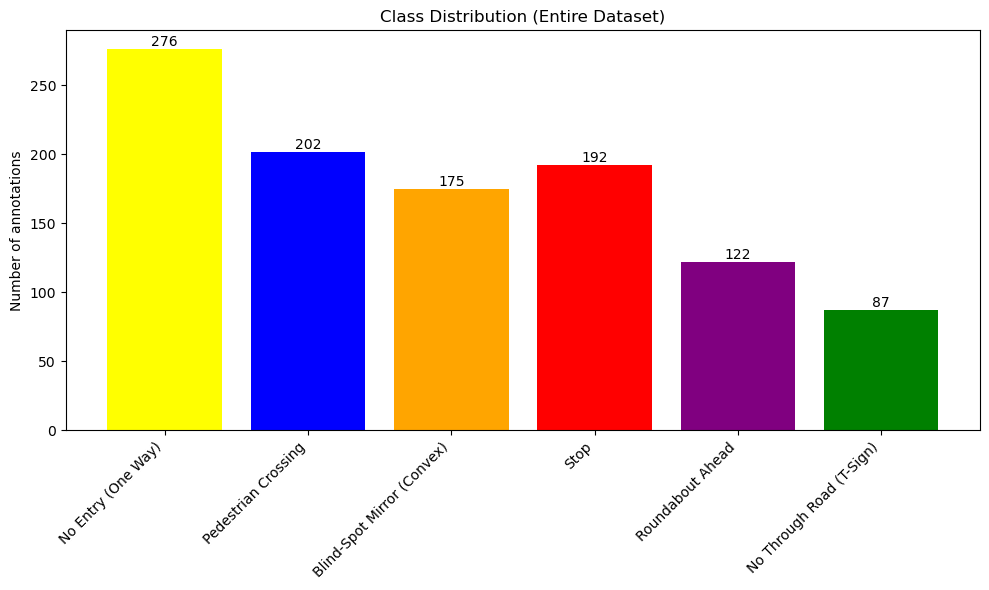

In [12]:
plot_bar(total_dist)

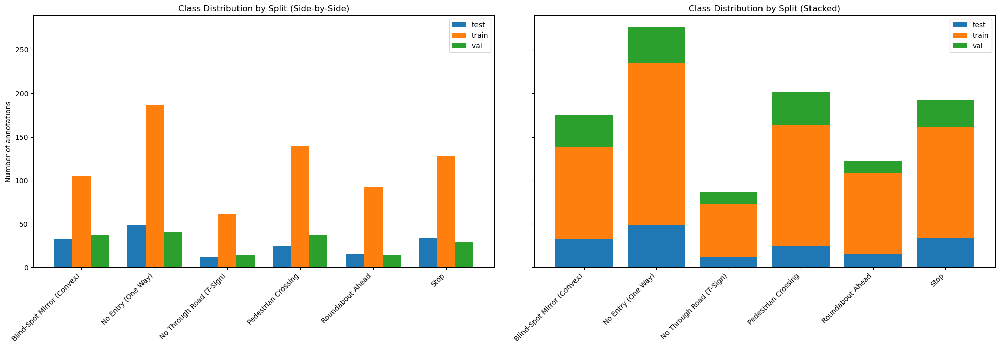

In [13]:
plot_bar_split(total_dist, all_dists)

### Viewing Angle

In [14]:
viewing_angle_path = os.path.join(COCO_DATA, 'COCO-based_COCO_view_angle', 'annotations')

In [15]:
# class distribution

print('Class Distribution per split:')

all_dists = {}
total_dist = Counter()   # to keep class counts for the entire dataset

for coco_file in os.listdir(viewing_angle_path):
    dist = class_distribution(os.path.join(viewing_angle_path, coco_file))
    all_dists[coco_file] = dist
    total_dist += dist
        
    print("\n" + coco_file.replace(".json", "") + ":\n")
    
    total = sum(dist.values())
    for cls, n in dist.most_common():
        print(f"{cls:15s}: {n} \t ({n/total:.2%})")

print()
print('\nClass Distribution for entire dataset:\n')

total = sum(total_dist.values())
for cls, n in total_dist.most_common():
    print(f"{cls:15s}: {n} \t ({n/total:.2%})")


Class Distribution per split:

test:

Side           : 60 	 (35.71%)
Front          : 57 	 (33.93%)
Back           : 51 	 (30.36%)

train:

Front          : 291 	 (40.87%)
Back           : 219 	 (30.76%)
Side           : 202 	 (28.37%)

val:

Front          : 71 	 (40.80%)
Side           : 52 	 (29.89%)
Back           : 51 	 (29.31%)


Class Distribution for entire dataset:

Front          : 419 	 (39.75%)
Back           : 321 	 (30.46%)
Side           : 314 	 (29.79%)


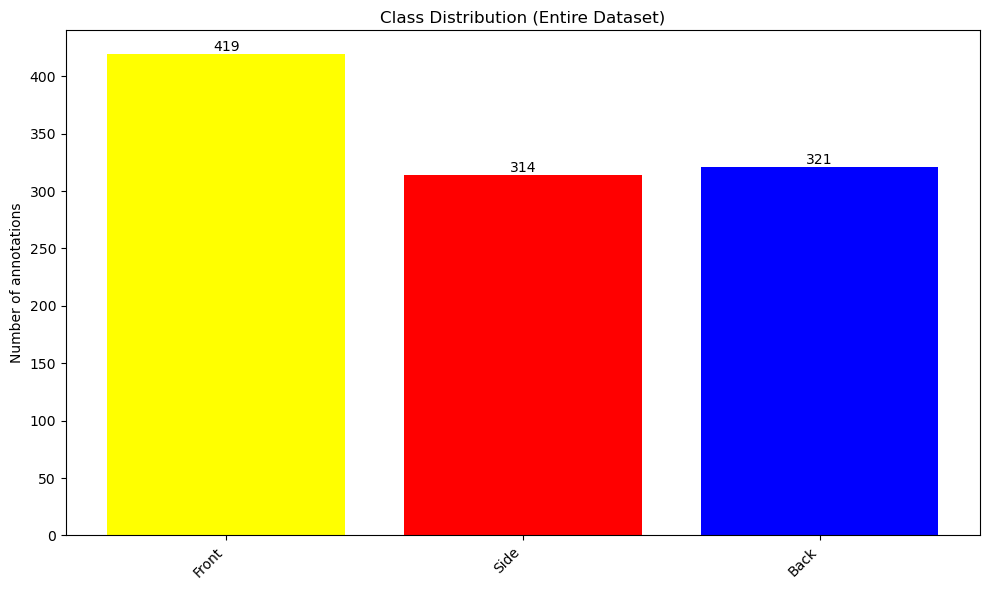

In [16]:
plot_bar(total_dist)

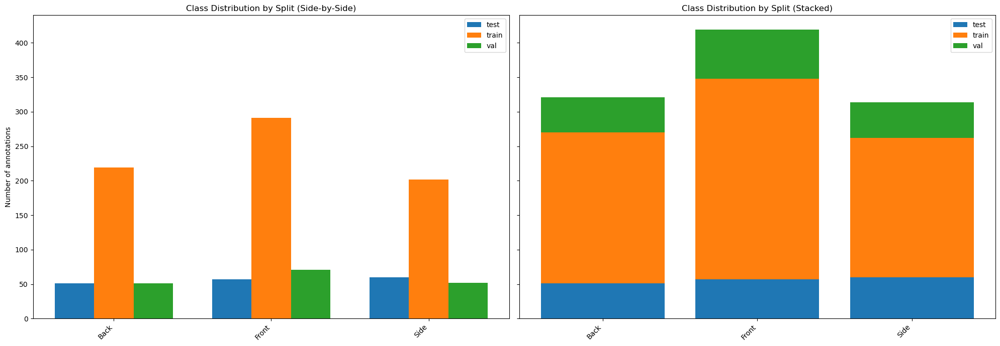

In [17]:
plot_bar_split(total_dist, all_dists)

### Mounting Type

In [18]:
mounting_type_path = os.path.join(COCO_DATA, 'COCO-based_COCO_mounting', 'annotations')

In [19]:
# class distribution

print('Class Distribution per split:')

all_dists = {}
total_dist = Counter()   # to keep class counts for the entire dataset

for coco_file in os.listdir(mounting_type_path):
    dist = class_distribution(os.path.join(mounting_type_path, coco_file))
    all_dists[coco_file] = dist
    total_dist += dist
        
    print("\n" + coco_file.replace(".json", "") + ":\n")
    
    total = sum(dist.values())
    for cls, n in dist.most_common():
        print(f"{cls:15s}: {n} \t ({n/total:.2%})")

print()
print('\nClass Distribution for entire dataset:\n')

total = sum(total_dist.values())
for cls, n in total_dist.most_common():
    print(f"{cls:15s}: {n} \t ({n/total:.2%})")


Class Distribution per split:

test:

Pole-mounted   : 147 	 (87.50%)
Wall-mounted   : 21 	 (12.50%)

train:

Pole-mounted   : 621 	 (87.22%)
Wall-mounted   : 91 	 (12.78%)

val:

Pole-mounted   : 149 	 (85.63%)
Wall-mounted   : 25 	 (14.37%)


Class Distribution for entire dataset:

Pole-mounted   : 917 	 (87.00%)
Wall-mounted   : 137 	 (13.00%)


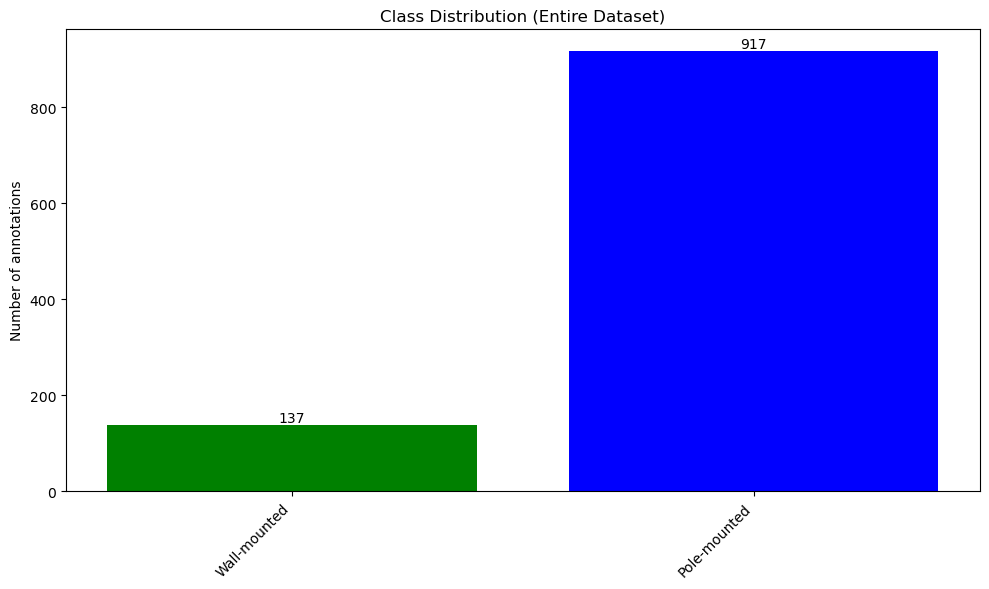

In [20]:
plot_bar(total_dist)

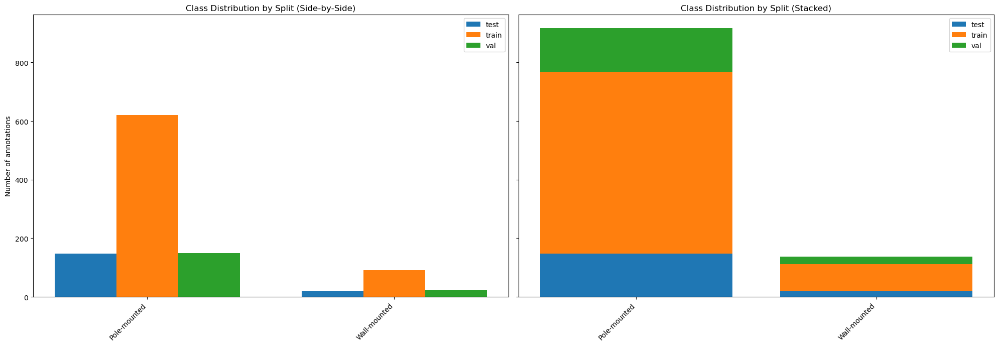

In [21]:
plot_bar_split(total_dist, all_dists)

### Sign Condition

In [22]:
sign_condition_path = os.path.join(COCO_DATA, 'COCO-based_COCO_condition', 'annotations')

In [23]:
# class distribution

print('Class Distribution per split:')

all_dists = {}
total_dist = Counter()   # to keep class counts for the entire dataset

for coco_file in os.listdir(sign_condition_path):
    dist = class_distribution(os.path.join(sign_condition_path, coco_file))
    all_dists[coco_file] = dist
    total_dist += dist
        
    print("\n" + coco_file.replace(".json", "") + ":\n")
    
    total = sum(dist.values())
    for cls, n in dist.most_common():
        print(f"{cls:20s}: {n} \t ({n/total:.2%})")

print()
print('\nClass Distribution for entire dataset:\n')

total = sum(total_dist.values())
for cls, n in total_dist.most_common():
    print(f"{cls:20s}: {n} \t ({n/total:.2%})")


Class Distribution per split:

test:

Good                : 113 	 (67.26%)
Weathered           : 49 	 (29.17%)
Heavily Damaged     : 6 	 (3.57%)

train:

Good                : 477 	 (66.99%)
Weathered           : 206 	 (28.93%)
Heavily Damaged     : 29 	 (4.07%)

val:

Good                : 117 	 (67.24%)
Weathered           : 52 	 (29.89%)
Heavily Damaged     : 5 	 (2.87%)


Class Distribution for entire dataset:

Good                : 707 	 (67.08%)
Weathered           : 307 	 (29.13%)
Heavily Damaged     : 40 	 (3.80%)


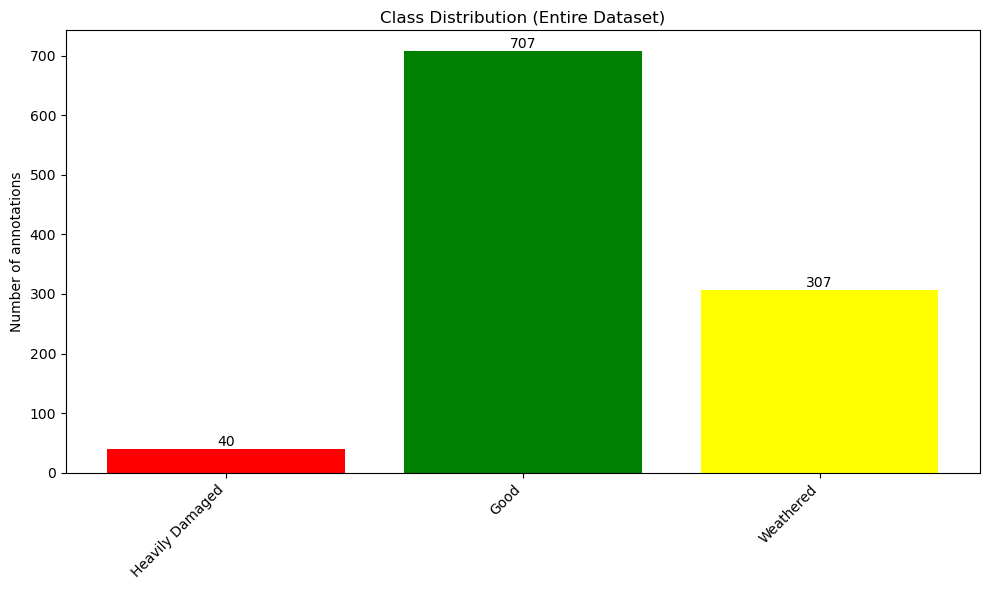

In [24]:
plot_bar(total_dist)

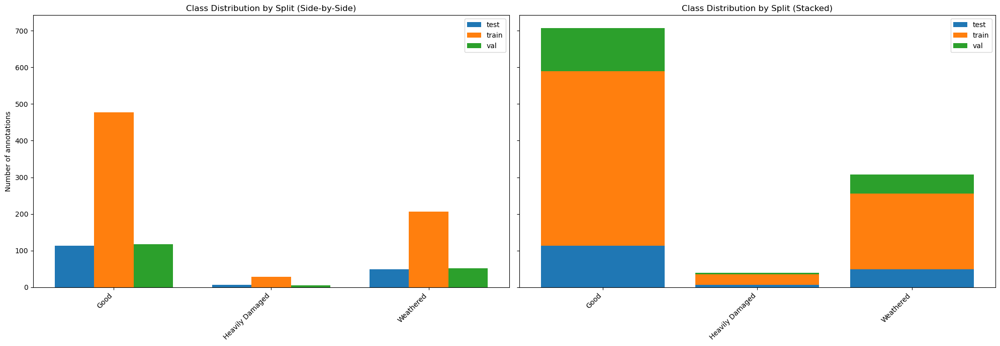

In [25]:
plot_bar_split(total_dist, all_dists)

### Sign Shape Type

In [26]:
sign_shape_path = os.path.join(COCO_DATA, 'COCO-based_COCO_sign_shape', 'annotations')

In [27]:
# class distribution

print('Class Distribution per split:')

all_dists = {}
total_dist = Counter()   # to keep class counts for the entire dataset

for coco_file in os.listdir(sign_shape_path):
    dist = class_distribution(os.path.join(sign_shape_path, coco_file))
    all_dists[coco_file] = dist
    total_dist += dist
        
    print("\n" + coco_file.replace(".json", "") + ":\n")
    
    total = sum(dist.values())
    for cls, n in dist.most_common():
        print(f"{cls:15s}: {n} \t ({n/total:.2%})")

print()
print('\nClass Distribution for entire dataset:\n')

total = sum(total_dist.values())
for cls, n in total_dist.most_common():
    print(f"{cls:15s}: {n} \t ({n/total:.2%})")


Class Distribution per split:

test:

Circular       : 89 	 (52.98%)
Octagonal      : 34 	 (20.24%)
Square         : 28 	 (16.67%)
Triangular     : 15 	 (8.93%)
Damaged        : 2 	 (1.19%)

train:

Circular       : 334 	 (46.91%)
Square         : 149 	 (20.93%)
Octagonal      : 121 	 (16.99%)
Triangular     : 84 	 (11.80%)
Damaged        : 24 	 (3.37%)

val:

Circular       : 89 	 (51.15%)
Square         : 39 	 (22.41%)
Octagonal      : 30 	 (17.24%)
Triangular     : 13 	 (7.47%)
Damaged        : 3 	 (1.72%)


Class Distribution for entire dataset:

Circular       : 512 	 (48.58%)
Square         : 216 	 (20.49%)
Octagonal      : 185 	 (17.55%)
Triangular     : 112 	 (10.63%)
Damaged        : 29 	 (2.75%)


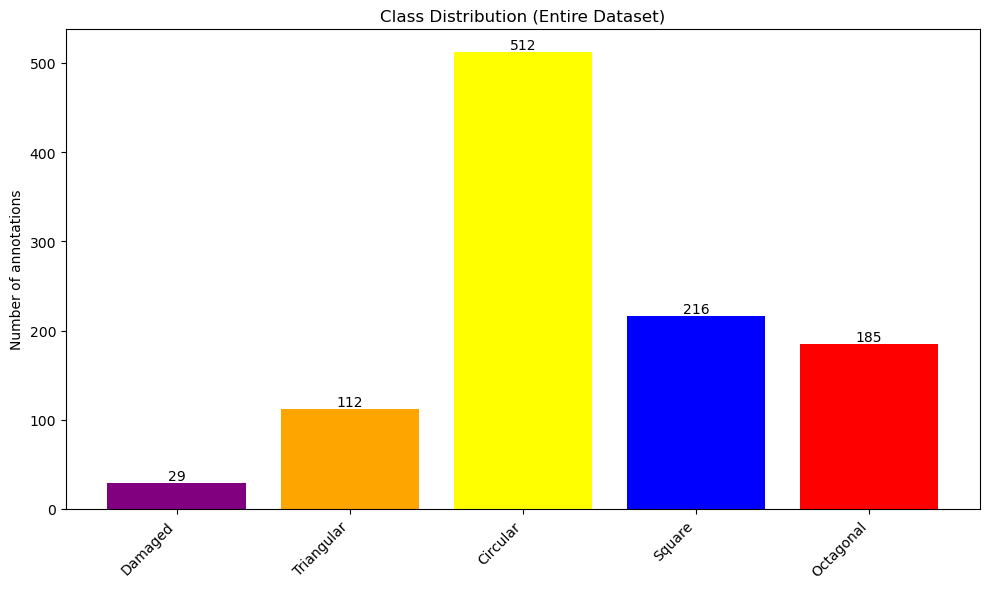

In [28]:
plot_bar(total_dist)

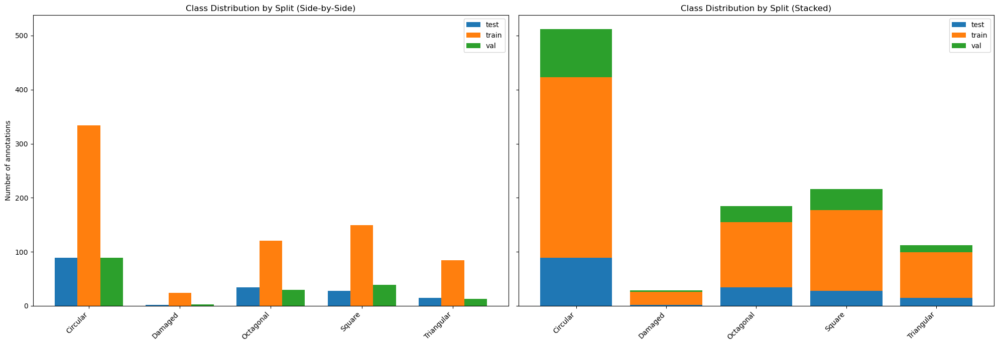

In [29]:
plot_bar_split(total_dist, all_dists)

## Visualising the Annotated Images

A few of the images from the dataset along with their bounding box annotations will be visualised below.

In [30]:
def plot_images(ann_path):
    ann_path = os.path.join(ann_path, "train.json")        # train annotations
    img_path = os.path.join(DATASET_SPLIT, "images.zip")   # images zip
    zip_file = zipfile.ZipFile(img_path, "r")
    
    with open(ann_path, "r") as f:
        coco = json.load(f)
        
    # get all of the image ids 
    images = {img["id"]: img for img in coco["images"]}
    
    # map the category ids to their name
    cat_id_to_name = {c["id"]: c["name"] for c in coco["categories"]}
    
    # get the list of annotations in each image
    anns_by_image = defaultdict(list)
    for ann in coco["annotations"]:
        anns_by_image[ann["image_id"]].append(ann)
        
    # map each category to the images that contain that category
    images_by_category = defaultdict(set)
    for ann in coco["annotations"]:
        images_by_category[ann["category_id"]].add(ann["image_id"])
        
    # select 6 random images from the dataset
    # trying to ensure diversity in the classes shown
    # at least one image per class
    
    selected_image_ids = []
    
    # select a random image from each category
    for cat_id, img_ids in images_by_category.items():
        selected_image_ids.append(random.choice(list(img_ids)))
    
    # if there arent enough images fill randomly until there are 6
    if len(selected_image_ids) < 6:
        remaining = list(set(images.keys()) - set(selected_image_ids))
        selected_image_ids += random.sample(remaining, 6 - len(selected_image_ids))
        
    # plot the selected images
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()
    
    for ax, img_id in zip(axes, selected_image_ids):
        img_info = images[img_id]
        
        # load image from zip
        zip_path = f"images/train/{img_info['file_name']}"
        with zip_file.open(zip_path) as f:
            img = Image.open(io.BytesIO(f.read())).convert("RGB")

        ax.imshow(img)
        ax.axis("off")
        
        # draw bounding boxes
        for ann in anns_by_image[img_id]:
            x, y, w, h = ann["bbox"]
            cat_name = cat_id_to_name[ann["category_id"]]
            colour = class_colours.get(cat_name, "white")

            rect = patches.Rectangle(
                (x, y), w, h,
                linewidth=2,
                edgecolor=colour,
                facecolor="none"
            )
            ax.add_patch(rect)

            ax.text(
                x, 
                y - 50,
                cat_name,
                color=colour,
                fontsize=10,
                bbox=dict(facecolor="white", alpha=0.7, edgecolor="none")
            )
            
    plt.tight_layout()
    plt.show()


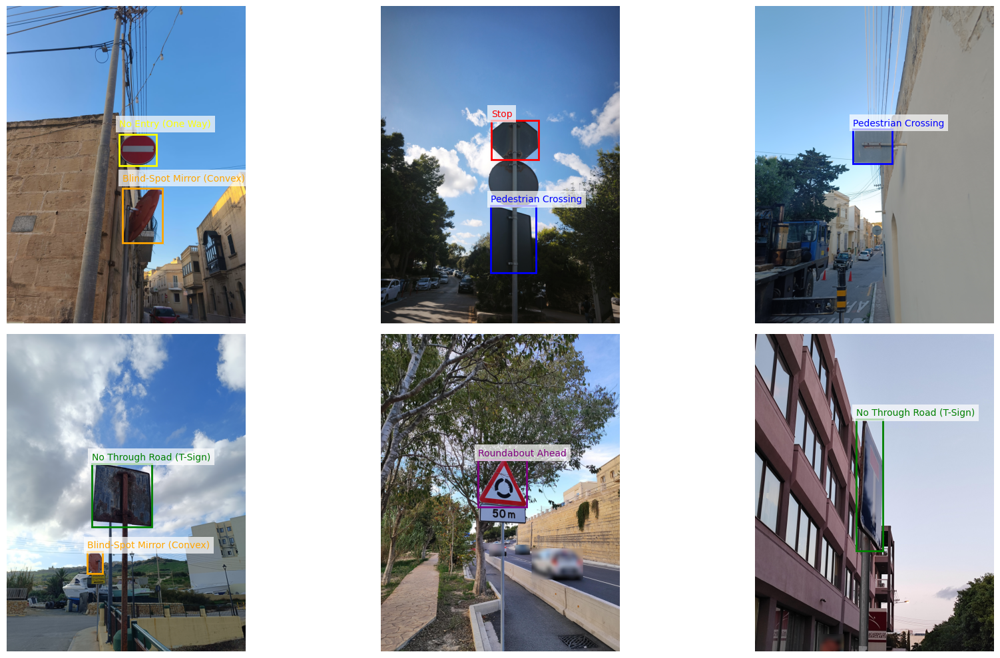

In [31]:
plot_images(sign_type_path)

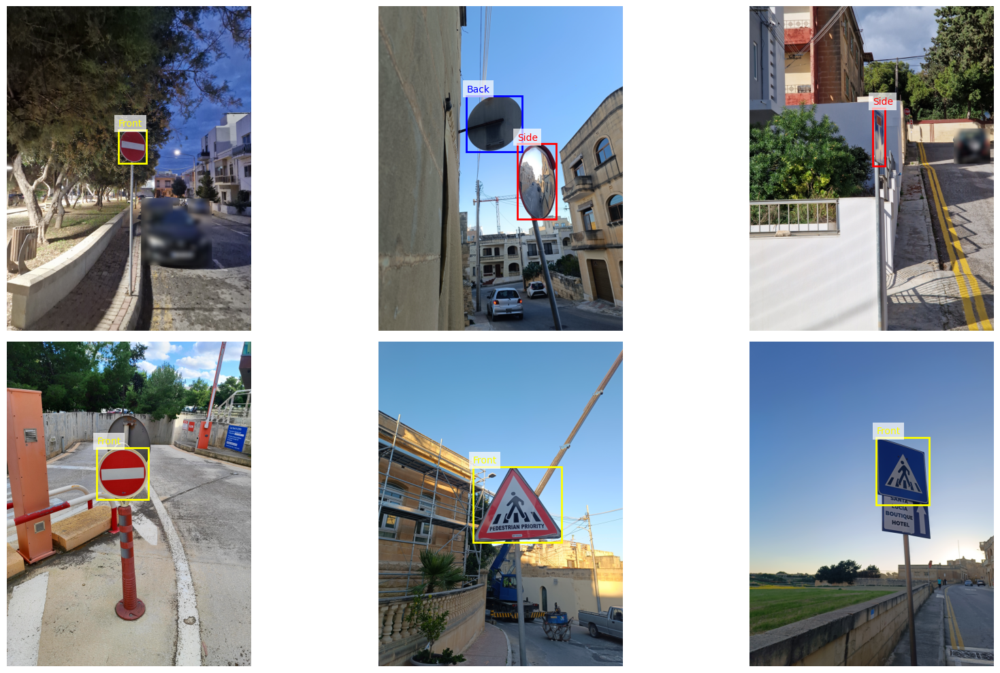

In [32]:
plot_images(viewing_angle_path)

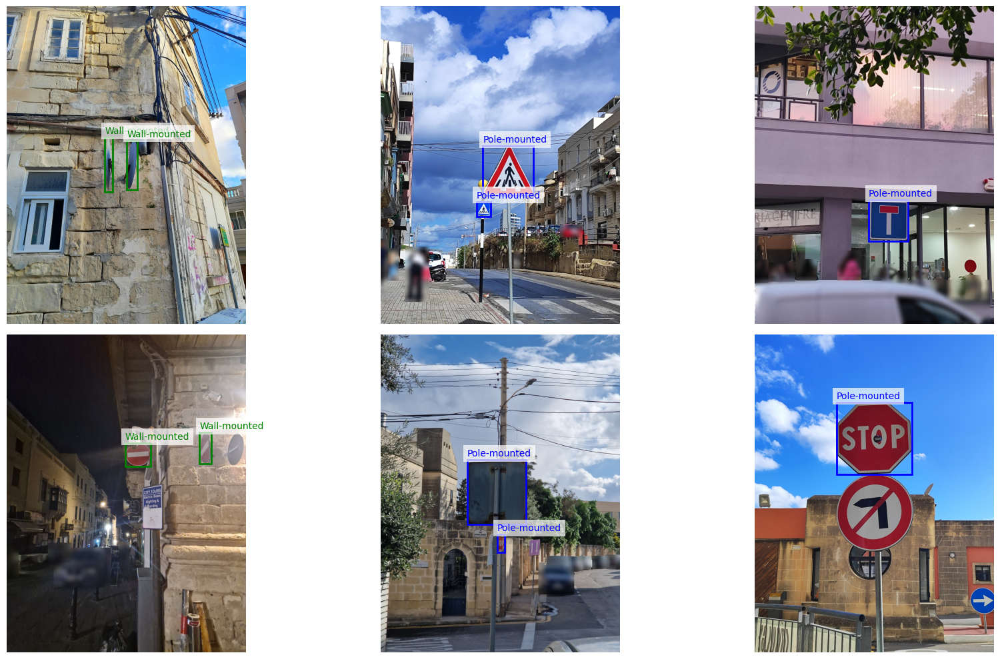

In [33]:
plot_images(mounting_type_path)

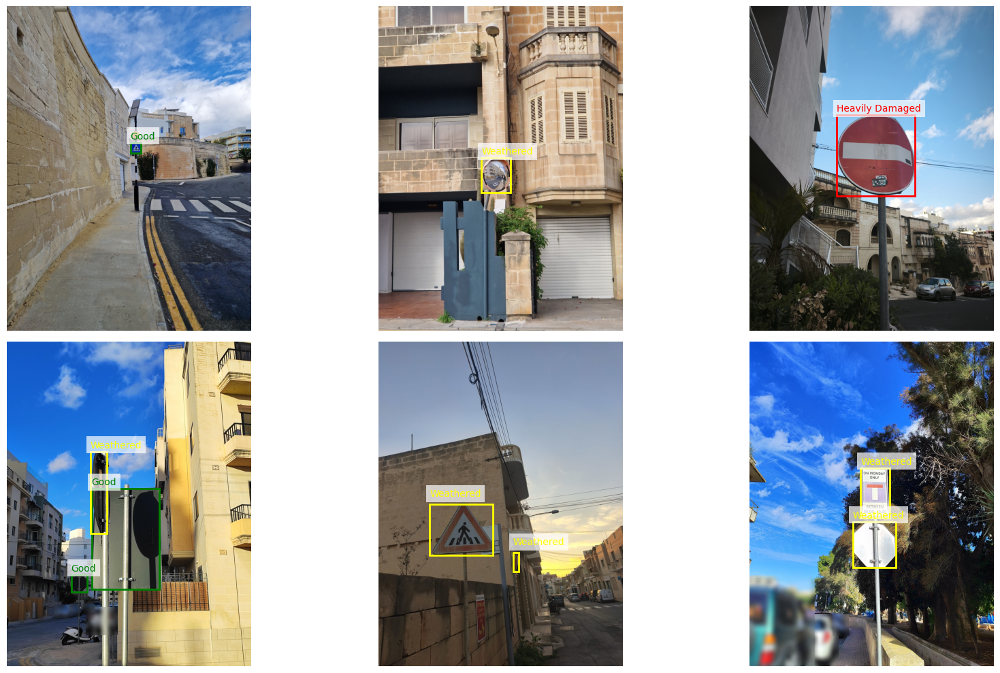

In [34]:
plot_images(sign_condition_path)

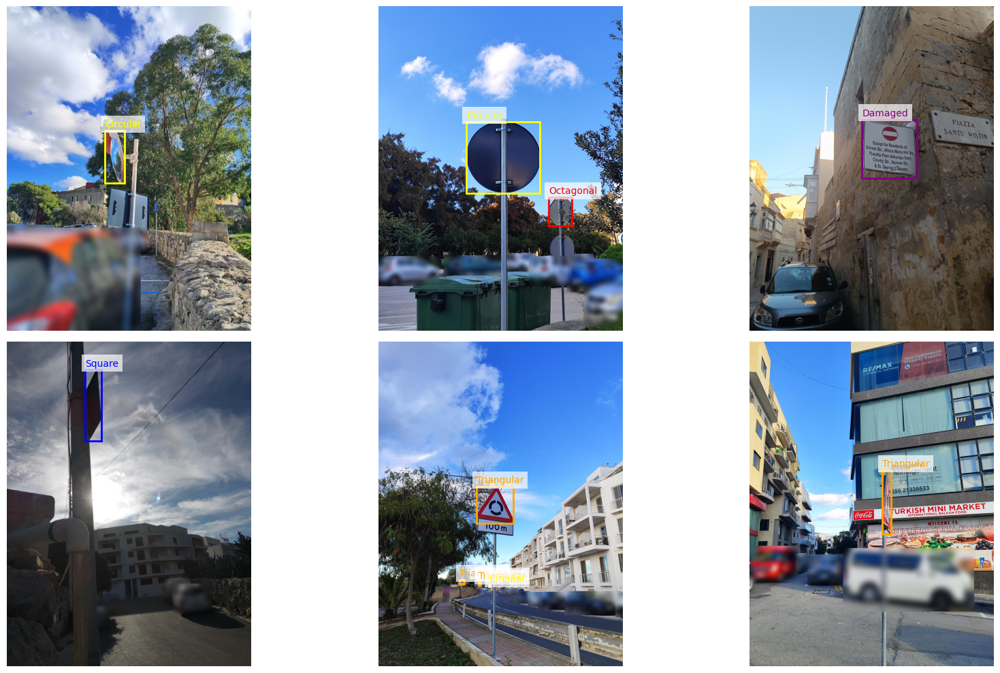

In [36]:
plot_images(sign_shape_path)